In [1]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image
import torch.nn as nn
from torchvision import transforms
import torch.optim as optim
from tqdm import tqdm
torch.backends.cudnn.benchmark = True
import pandas as pd
import random
import wandb

In [2]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 2e-4
BATCH_SIZE = 16
NUM_WORKERS = 2
L1_LAMBDA = 100
NUM_EPOCHS = 100
LOAD_MODEL = False
SAVE_MODEL = True
CHECKPOINT_DISC = "discpaierd.pth.tar"
CHECKPOINT_GEN = "genpaired.pth.tar"

In [113]:
wandb.init(project="ConditionalGAN")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: gyanendrachaubey (gyanendrachaubeyproject). Use `wandb login --relogin` to force relogin


In [3]:
class ISICDataset(Dataset):
    def __init__(self, img_dir, sketch_dir, label_csv, transform=None):
        self.img_dir = img_dir
        self.sketch_dir = sketch_dir
        self.transform = transform
        self.labels_df = pd.read_csv(label_csv)
        
        # Get list of filenames (assuming equal number of sketches and images)
        self.filenames = [f for f in os.listdir(img_dir) if f.endswith(".jpg")]

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, index):
        base_filename = os.path.splitext(self.filenames[index])[0]
        
        # Construct paths
        sketch_path = os.path.join(self.sketch_dir, base_filename + "_segmentation.png")
        real_image_path = os.path.join(self.img_dir, base_filename + ".jpg")
        
         # Load label
        label = self.labels_df.iloc[index, 1:].values.astype(float)
        #label_tensor = torch.tensor(label, dtype=torch.float32)
        true_label_image = torch.zeros((256, 256, 7))
        for i, value in enumerate(label):
            true_label_image[:, :, i] = value

        # Load images
        sketch = Image.open(sketch_path)
        real_image = Image.open(real_image_path)

        # Resize
        sketch = sketch.convert('RGB')

        input_image = np.array(sketch)
        target_image = np.array(real_image)

        augmentations = both_transform(image=input_image, image0=target_image)
        input_image = augmentations["image"]
        target_image = augmentations["image0"]

        input_image = transform_only_input(image=input_image)["image"]
        target_image = transform_only_mask(image=target_image)["image"]

        return input_image, target_image, true_label_image

In [4]:
both_transform = A.Compose(
    [A.Resize(width=256, height=256),], additional_targets={"image0": "image"},
)

transform_only_input = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.ColorJitter(p=0.2),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ]
)

transform_only_mask = A.Compose(
    [
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ]
)

In [5]:
class Block(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, act="relu", use_dropout=False):
        super(Block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, 2, 1, bias=False, padding_mode="reflect")
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU() if act == "relu" else nn.LeakyReLU(0.2),
        )

        self.use_dropout = use_dropout
        self.dropout = nn.Dropout(0.5)
        self.down = down

    def forward(self, x):
        x = self.conv(x)
        return self.dropout(x) if self.use_dropout else x


class Generator(nn.Module):
    def __init__(self, in_channels=3, label_dim=7,features=64):
        super().__init__()
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels+label_dim, features, 4, 2, 1, padding_mode="reflect"),
            nn.LeakyReLU(0.2),
        )
        self.down1 = Block(features, features * 2, down=True, act="leaky", use_dropout=False)
        self.down2 = Block(
            features * 2, features * 4, down=True, act="leaky", use_dropout=False
        )
        self.down3 = Block(
            features * 4, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down4 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down5 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down6 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, 4, 2, 1), nn.ReLU()
        )
        self.up1 = Block(features * 8, features * 8, down=False, act="relu", use_dropout=True)
        self.up2 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up3 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up4 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=False
        )
        self.up5 = Block(
            features * 8 * 2, features * 4, down=False, act="relu", use_dropout=False
        )
        self.up6 = Block(
            features * 4 * 2, features * 2, down=False, act="relu", use_dropout=False
        )
        self.up7 = Block(features * 2 * 2, features, down=False, act="relu", use_dropout=False)
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, in_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        #print(x.shape)
        d1 = self.initial_down(x)
        #print("d1",d1.shape)
        d2 = self.down1(d1)
        #print("d2",d2.shape)
        d3 = self.down2(d2)
        #print("d3",d3.shape)
        d4 = self.down3(d3)
        #print("d4",d4.shape)
        d5 = self.down4(d4)
        #print("d5",d5.shape)
        d6 = self.down5(d5)
        #print("d6",d6.shape)
        d7 = self.down6(d6)
        #print("d7",d7.shape)
        bottleneck = self.bottleneck(d7)
        #print("bottleneck",bottleneck.shape)
        up1 = self.up1(bottleneck)
        #print("up1",up1.shape)
        up2 = self.up2(torch.cat([up1, d7], 1))
        #print("up2",up2.shape)
        up3 = self.up3(torch.cat([up2, d6], 1))
        #print("up3",up3.shape)
        up4 = self.up4(torch.cat([up3, d5], 1))
        up5 = self.up5(torch.cat([up4, d4], 1))
        up6 = self.up6(torch.cat([up5, d3], 1))
        up7 = self.up7(torch.cat([up6, d2], 1))
        #print(self.final_up(torch.cat([up7, d1], 1)).shape)
        return self.final_up(torch.cat([up7, d1], 1))

In [6]:
class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super(CNNBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(
                in_channels, out_channels, 4, stride, 1, bias=False, padding_mode="reflect"
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.conv(x)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, label_dim=7, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                (in_channels+label_dim) * 2,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(
                CNNBlock(in_channels, feature, stride=1 if feature == features[-1] else 2),
            )
            in_channels = feature

        layers.append(
            nn.Conv2d(
                in_channels, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect"
            ),
        )

        self.model = nn.Sequential(*layers)

    def forward(self, x, y):
        #print(x.shape,y.shape)
        x = torch.cat([x, y], dim=1)
        x = self.initial(x)
        x = self.model(x)
        return x

In [7]:
def save_some_examples(gen, val_loader, epoch, folder):
    x, y, label = next(iter(val_loader))
    x, label, y = x.to(DEVICE), label.to(DEVICE), y.to(DEVICE)
    label=label.permute(0,3,1,2)
    
    x_c = torch.cat((x, label), dim=1)
    gen.eval()
    with torch.no_grad():
        y_fake = gen(x_c)
        #print(y_fake.shape)
        y_fake = y_fake * 0.5 + 0.5  # remove normalization#
        save_image(y_fake, folder + f"/y_gen_{epoch}.png")
        save_image(x * 0.5 + 0.5, folder + f"/input_{epoch}.png")
        if epoch == 1:
            save_image(y * 0.5 + 0.5, folder + f"/label_{epoch}.png")
    gen.train()


def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

In [8]:
def train_fn(
    disc, gen, loader, opt_disc, opt_gen, l1_loss, bce, g_scaler, d_scaler,
):
    loop = tqdm(loader, leave=True)

    for idx, (x, y, label) in enumerate(loop):
        x = x.to(DEVICE) #sketches
        label = label.to(DEVICE) #labels
        y = y.to(DEVICE) #images
        
        #print(x.shape, label.shape, y.shape)
        
        label=label.permute(0,3,1,2)
        
        #print(x.shape, label.shape, y.shape)
        
        x_c = torch.cat((x, label), dim=1)
        
        y_c = torch.cat((y, label), dim=1)
        
        # Train Discriminator
        with torch.cuda.amp.autocast():
            y_fake = gen(x_c)
            #print(y_fake.shape)
            y_fake = torch.cat((y_fake, label), dim=1) 
            D_real = disc(x_c, y_c)
            D_real_loss = bce(D_real, torch.ones_like(D_real))
            #print(x.shape, y_fake.shape)
            D_fake = disc(x_c, y_fake.detach())
            D_fake_loss = bce(D_fake, torch.zeros_like(D_fake))
            D_loss = (D_real_loss + D_fake_loss) / 2

        disc.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # Train generator
        with torch.cuda.amp.autocast():
            D_fake = disc(x_c, y_fake)
            G_fake_loss = bce(D_fake, torch.ones_like(D_fake))
            L1 = l1_loss(y_fake, y_c) * L1_LAMBDA
            G_loss = G_fake_loss + L1

        opt_gen.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()
        
        wandb.log({"epoch": idx+1, "D_loss": D_loss.item(), "G_loss": G_loss.item()})

        if idx % 10 == 0:
            loop.set_postfix(
                D_real=torch.sigmoid(D_real).mean().item(),
                D_fake=torch.sigmoid(D_fake).mean().item(),
            )

In [9]:
def main():
    disc = Discriminator(in_channels=3, label_dim=7).to(DEVICE)
    gen = Generator(in_channels=3, label_dim=7, features=64).to(DEVICE)
    opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999),)
    opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
    BCE = nn.BCEWithLogitsLoss()
    L1_LOSS = nn.L1Loss()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GEN, gen, opt_gen, LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_DISC, disc, opt_disc, LEARNING_RATE,
        )
        
    train_sketch_folder='/workspace/ConditionalGAN/New_Dataset/Train/Paired_train_sketches'
    train_image_folder='/workspace/ConditionalGAN/New_Dataset/Train/Train_data'
    train_label_csv='/workspace/ConditionalGAN/New_Dataset/Train/Train_labels.csv'

    test_sketch_folder='/workspace/ConditionalGAN/New_Dataset/Test/Paired_test_sketch'
    test_image_folder='/workspace/ConditionalGAN/New_Dataset/Test/Test_data'
    test_label_csv='/workspace/ConditionalGAN/New_Dataset/Test/Test_labels.csv'


    train_dataset = ISICDataset(train_image_folder,train_sketch_folder,train_label_csv)
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
    )
    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()
    val_dataset = ISICDataset(test_image_folder,test_sketch_folder,test_label_csv)
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

    for epoch in range(NUM_EPOCHS):
        train_fn(
            disc, gen, train_loader, opt_disc, opt_gen, L1_LOSS, BCE, g_scaler, d_scaler,
        )

        if SAVE_MODEL and epoch % 5 == 0:
            save_checkpoint(gen, opt_gen, filename=CHECKPOINT_GEN)
            save_checkpoint(disc, opt_disc, filename=CHECKPOINT_DISC)

        save_some_examples(gen, val_loader, epoch, folder="evaluation-paired")
    wandb.finish()

In [143]:
if __name__ == "__main__":
    main()

100%|█████████████████████████████████████████████████████████| 564/564 [01:48<00:00,  5.18it/s, D_fake=0.512, D_real=0.453]


=> Saving checkpoint
=> Saving checkpoint


100%|██████████████████████████████████████████████████████████| 564/564 [01:49<00:00,  5.13it/s, D_fake=0.406, D_real=0.51]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:47<00:00,  5.25it/s, D_fake=0.431, D_real=0.437]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:47<00:00,  5.26it/s, D_fake=0.393, D_real=0.493]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:47<00:00,  5.27it/s, D_fake=0.484, D_real=0.556]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:46<00:00,  5.30it/s, D_fake=0.487, D_real=0.551]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:48<00:00,  5.22it/s, D_fake=0.485, D_real=0.451]


=> Saving checkpoint
=> Saving checkpoint


100%|███████████████████████████████████████████████████████████| 564/564 [01:47<00:00,  5.24it/s, D_fake=0.45, D_real=0.46]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:49<00:00,  5.17it/s, D_fake=0.492, D_real=0.325]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:43<00:00,  5.46it/s, D_fake=0.442, D_real=0.287]


=> Saving checkpoint
=> Saving checkpoint


100%|██████████████████████████████████████████████████████████| 564/564 [01:44<00:00,  5.41it/s, D_fake=0.49, D_real=0.516]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.51it/s, D_fake=0.393, D_real=0.485]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.50it/s, D_fake=0.429, D_real=0.431]


=> Saving checkpoint
=> Saving checkpoint


100%|███████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.50it/s, D_fake=0.49, D_real=0.47]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.50it/s, D_fake=0.467, D_real=0.573]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:43<00:00,  5.44it/s, D_fake=0.472, D_real=0.453]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.48it/s, D_fake=0.417, D_real=0.574]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:43<00:00,  5.44it/s, D_fake=0.456, D_real=0.407]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.48it/s, D_fake=0.387, D_real=0.602]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.49it/s, D_fake=0.449, D_real=0.406]


=> Saving checkpoint
=> Saving checkpoint


100%|█████████████████████████████████████████████████████████| 564/564 [01:42<00:00,  5.49it/s, D_fake=0.388, D_real=0.576]


D_loss,▁▄▃▇▅▅▅▄▅▇▆▄▇▆▆█▆▅▆▅▅▅▅▅▆▅▇▆▇▄▆▅▆▅▆▆▅█▇▆
G_loss,█▇█▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▇▄▂▃▁▆▄▂▇▅▃▁▇▅▃█▆▄▂▇▅▃▁▆▄▂█▆▄▂▇▅▃█▆▄▂▇▅▃
D_loss,0.5403
G_loss,4.34093
epoch,564


In [144]:
wandb.finish()

In [10]:
test_sketch_folder='/workspace/ConditionalGAN/New_Dataset/Test/Paired_test_sketch'
test_image_folder='/workspace/ConditionalGAN/New_Dataset/Test/Test_data'
test_label_csv='/workspace/ConditionalGAN/New_Dataset/Test/Test_labels.csv'

val_dataset = ISICDataset(test_image_folder,test_sketch_folder,test_label_csv)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

In [11]:
# Load the trained model for inference
G_loaded = Generator(in_channels=3, label_dim=7, features=64).to(DEVICE)
D_loaded = Discriminator(in_channels=3).to(DEVICE)

checkpoint1 = torch.load('disc-paired.pth.tar')
checkpoint2 = torch.load('gen-paired.pth.tar')
D_loaded.load_state_dict(checkpoint1['state_dict'])
G_loaded.load_state_dict(checkpoint2['state_dict'])

RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.

  0%|                                                                                              | 0/1000 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


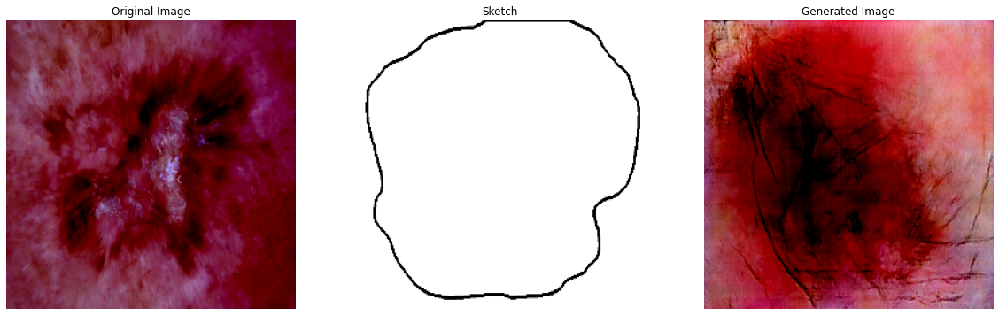

  0%|                                                                                      | 1/1000 [00:00<06:46,  2.46it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


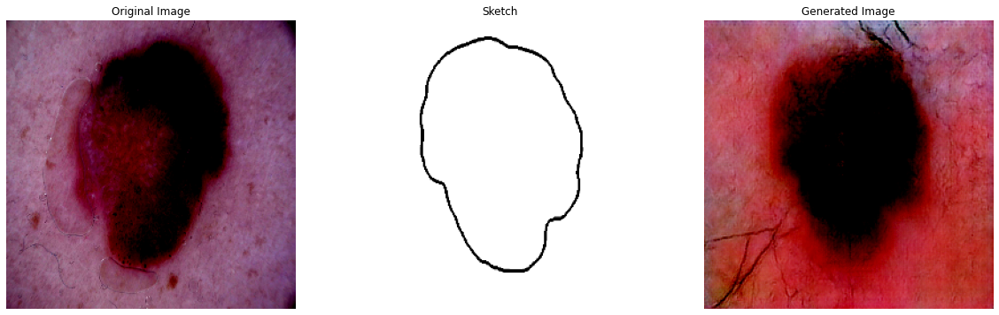

  0%|▏                                                                                     | 2/1000 [00:00<06:24,  2.60it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


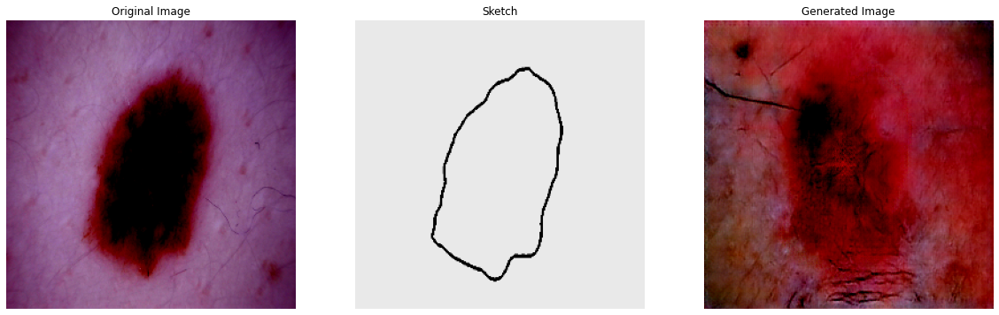

  0%|▎                                                                                     | 3/1000 [00:01<06:26,  2.58it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


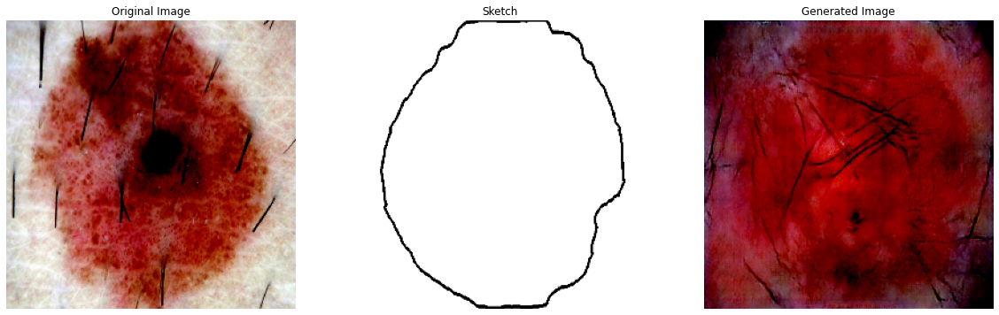

  0%|▎                                                                                     | 4/1000 [00:01<06:24,  2.59it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


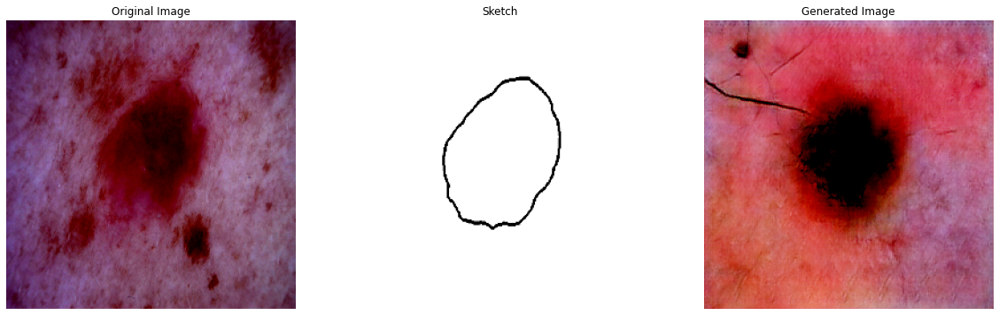

  0%|▍                                                                                     | 5/1000 [00:01<06:30,  2.55it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


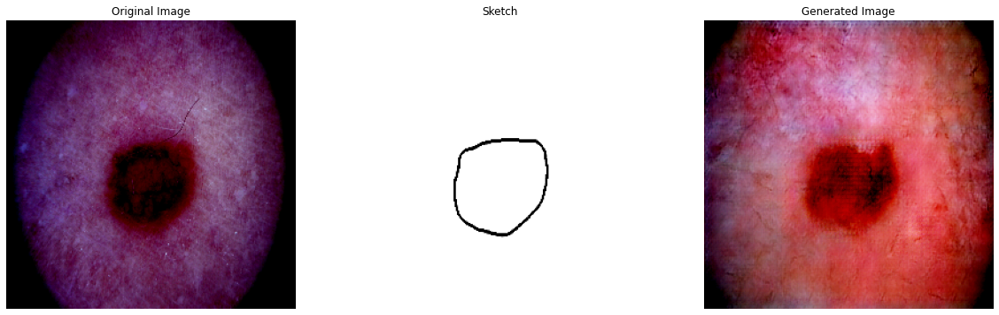

  1%|▌                                                                                     | 6/1000 [00:02<07:41,  2.15it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


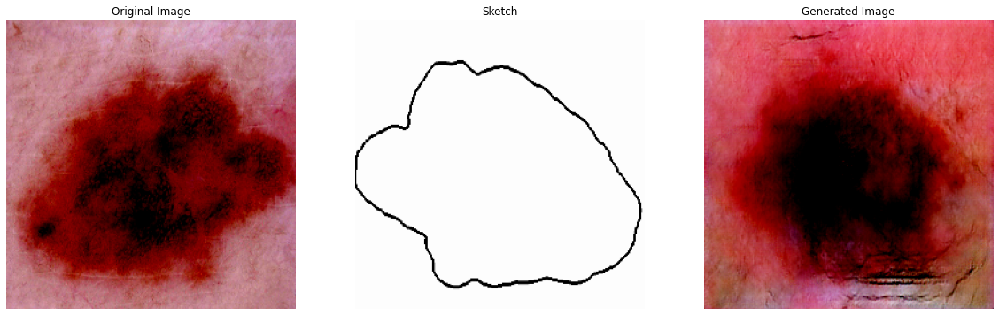

  1%|▌                                                                                     | 7/1000 [00:02<07:14,  2.28it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


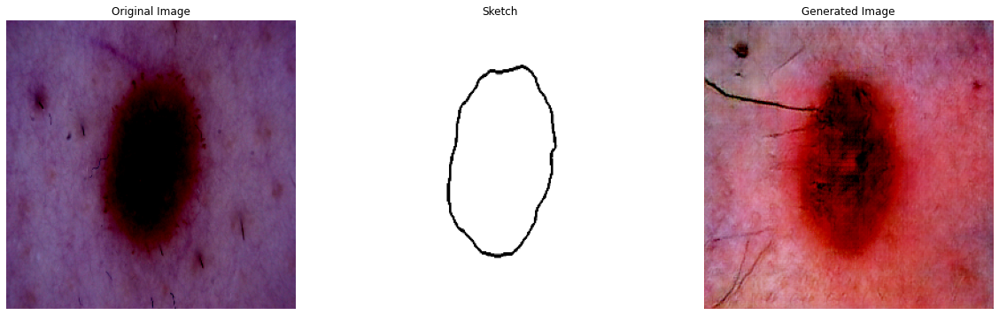

  1%|▋                                                                                     | 8/1000 [00:03<07:01,  2.36it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


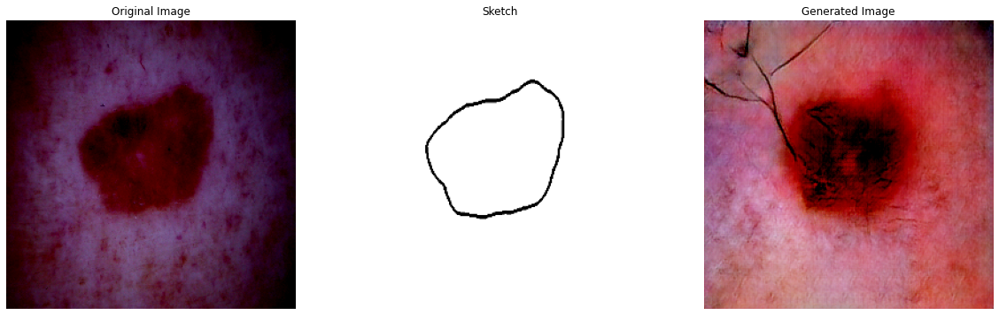

  1%|▊                                                                                     | 9/1000 [00:03<06:51,  2.41it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


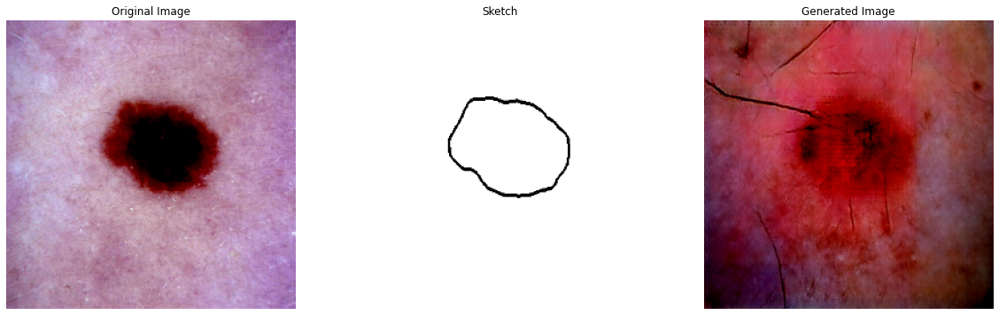

  1%|▊                                                                                    | 10/1000 [00:04<06:45,  2.44it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


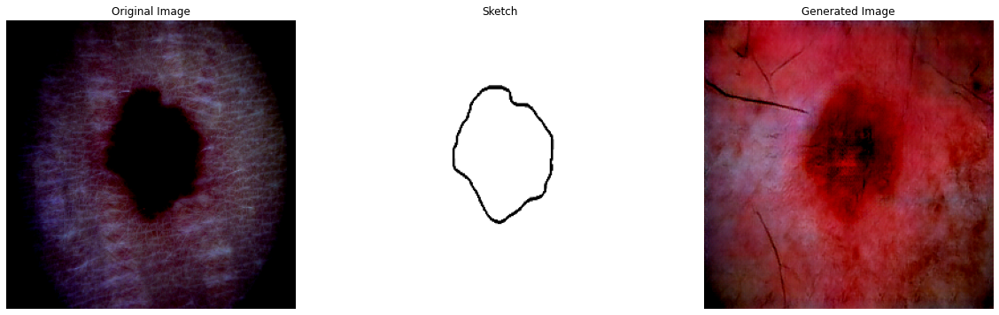

  1%|▉                                                                                    | 11/1000 [00:04<06:33,  2.52it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


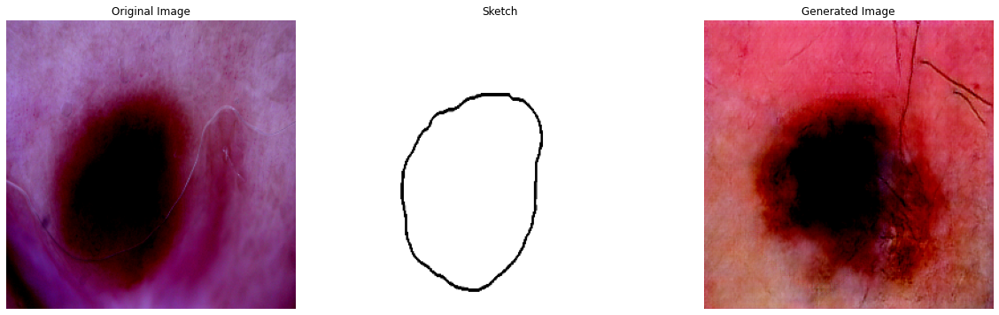

  1%|█                                                                                    | 12/1000 [00:04<06:29,  2.54it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


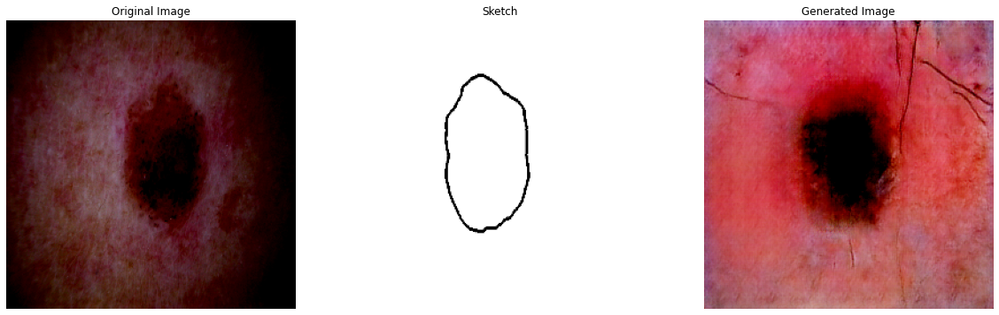

  1%|█                                                                                    | 13/1000 [00:05<06:25,  2.56it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


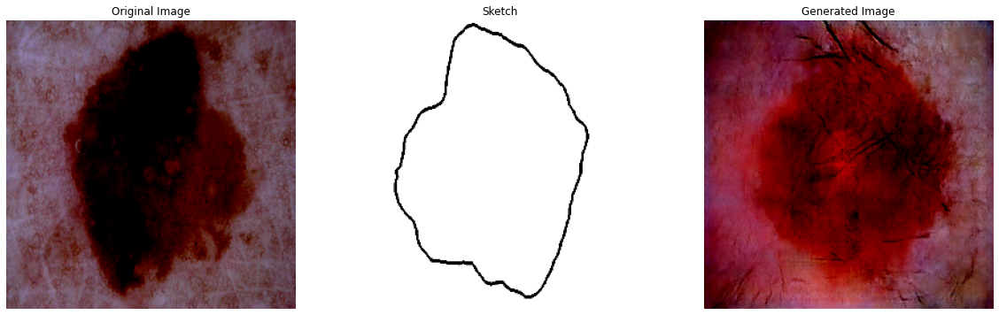

  1%|█▏                                                                                   | 14/1000 [00:05<06:19,  2.60it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


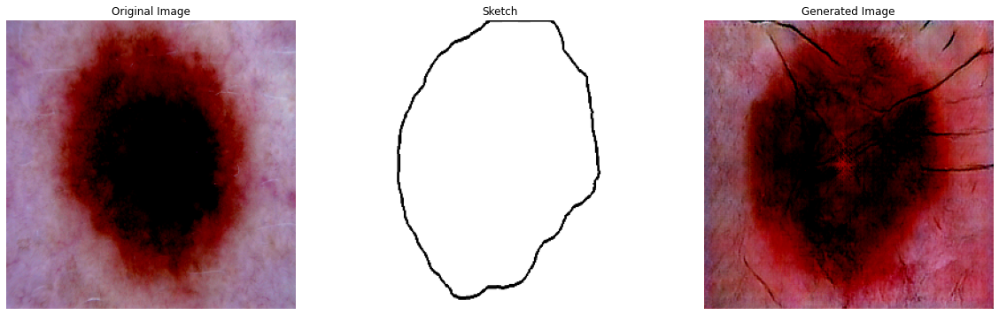

  2%|█▎                                                                                   | 15/1000 [00:06<06:15,  2.62it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


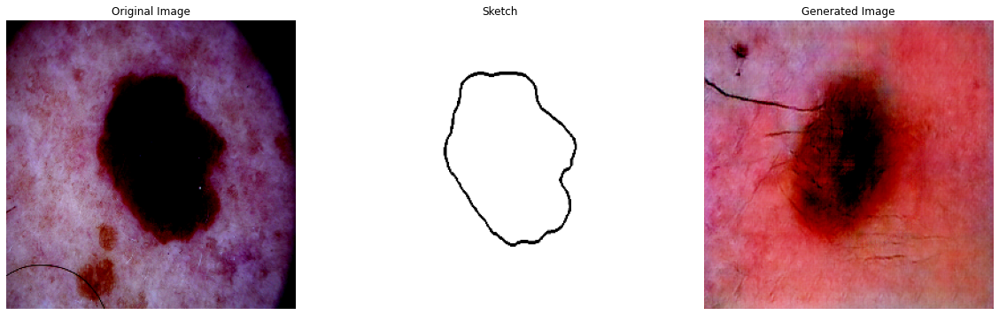

  2%|█▎                                                                                   | 16/1000 [00:06<06:15,  2.62it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


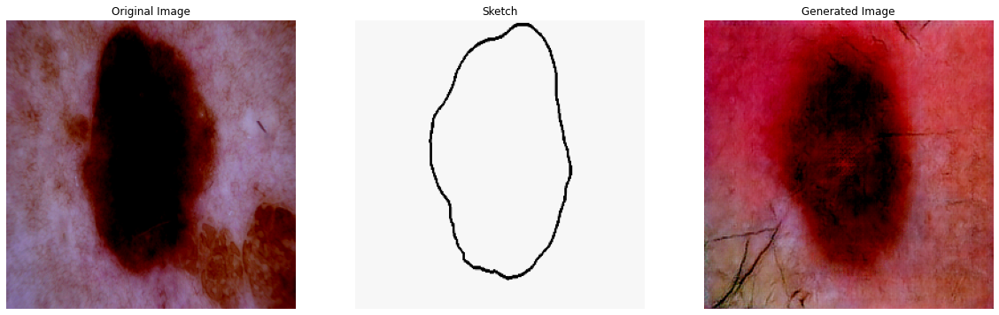

  2%|█▍                                                                                   | 17/1000 [00:06<07:16,  2.25it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


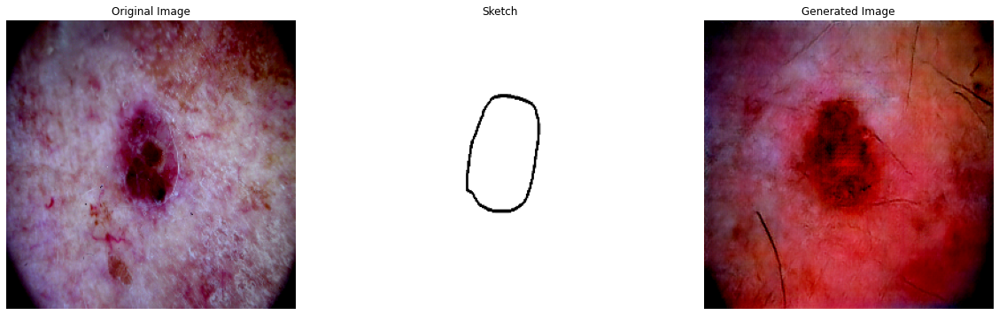

  2%|█▌                                                                                   | 18/1000 [00:07<07:01,  2.33it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


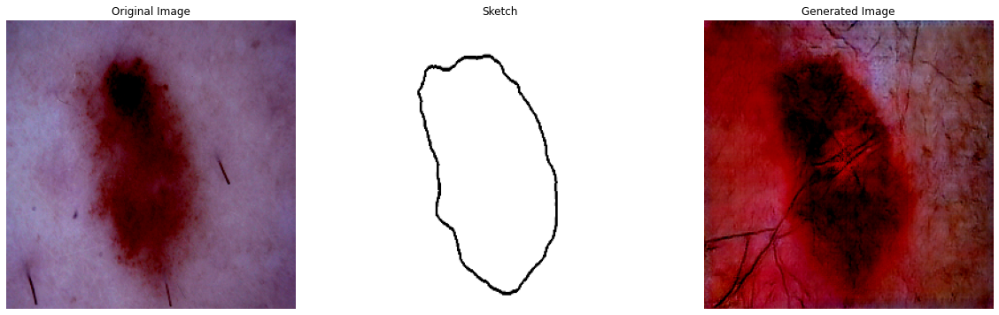

  2%|█▌                                                                                   | 19/1000 [00:07<06:49,  2.39it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


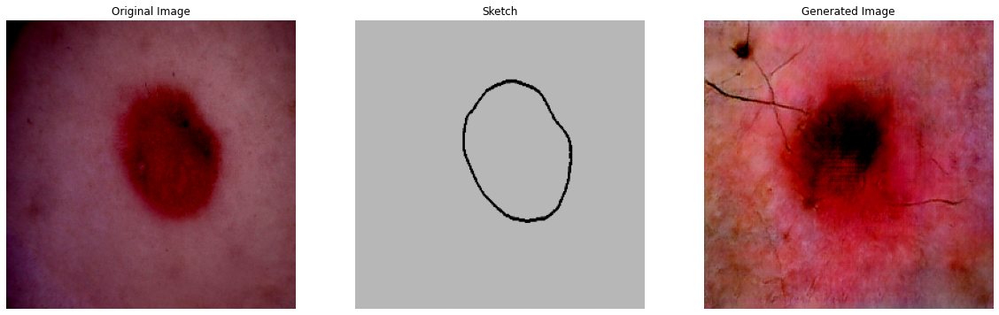

  2%|█▋                                                                                   | 20/1000 [00:08<06:45,  2.42it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


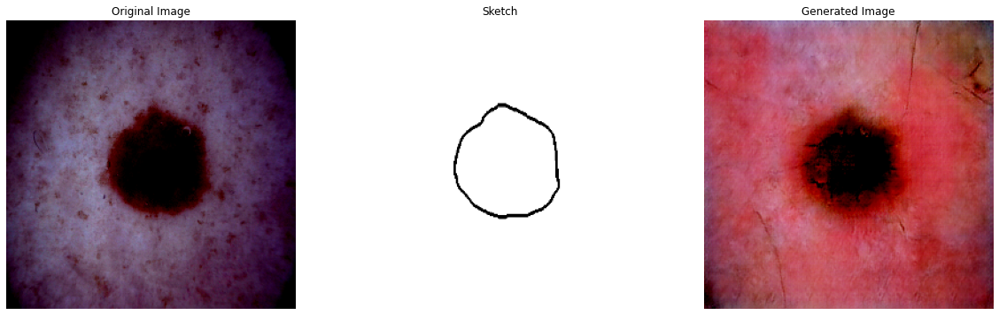

  2%|█▋                                                                                   | 20/1000 [00:08<06:59,  2.33it/s]


In [174]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
os.makedirs("images", exist_ok=True)
loop = tqdm(val_loader, leave=True)
# Generate and visualize a single sample image using test loader
for idx, (x, y, label) in enumerate(loop):
    #test_iter = iter(val_loader)
    #x, y, label = next(test_iter)

    x = x.to(DEVICE)  # sketch
    label = label.to(DEVICE)  # label
    y = y.to(DEVICE)  # original image

    label = label.permute(0, 3, 1, 2)

    # Concatenate input sketch and label
    x_c = torch.cat((x, label), dim=1)

    # Generate an image using the generator
    generated_image = G_loaded(x_c)
    
    generated_image_np = np.transpose(generated_image[0].cpu().detach().numpy(), (1, 2, 0))
    plt.imsave(f"images/generated_image_{idx}.png", generated_image_np)

    # Visualize the images side by side
    plt.figure(figsize=(20, 6))

    # Plot original image
    plt.subplot(1, 3, 1)
    plt.axis("off")
    plt.title("Original Image")
    plt.imshow(np.transpose(y[0].cpu().detach().numpy(), (1, 2, 0)))

    # Plot sketch
    plt.subplot(1, 3, 2)
    plt.axis("off")
    plt.title("Sketch")
    plt.imshow(np.transpose(x[0].cpu().detach().numpy(), (1, 2, 0)), cmap='gray')

    # Plot generated image
    plt.subplot(1, 3, 3)
    plt.axis("off")
    plt.title("Generated Image")
    plt.imshow(np.transpose(generated_image[0].cpu().detach().numpy(), (1, 2, 0)))

    plt.show()
    
    if idx==20:
        break

In [20]:
import os
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

os.makedirs("images", exist_ok=True)

# Loop over the validation data loader
for idx, (x, y, label) in enumerate(val_loader):
    # Move data to device
    x = x.to(DEVICE)  # sketch
    label = label.to(DEVICE)  # label
    y = y.to(DEVICE)  # original image

    label = label.permute(0, 3, 1, 2)

    # Concatenate input sketch and label
    x_c = torch.cat((x, label), dim=1)

    # Generate an image using the generator
    generated_image = G_loaded(x_c)

    # Convert the generated image to numpy array
    generated_image_np = generated_image[0].cpu().detach().numpy()
    
    # Normalize the pixel values in the range [0, 1]
    generated_image_np_normalized = (generated_image_np - generated_image_np.min()) / (generated_image_np.max() - generated_image_np.min())

    # Get the corresponding filename
    filename = val_loader.dataset.filenames[idx]

    # Save the normalized image with the original filename
    plt.imsave(f"images/{filename}", np.transpose(generated_image_np_normalized, (1, 2, 0)))

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from scipy.linalg import sqrtm

# Define the InceptionV3 model
class InceptionV3(nn.Module):
    def _init_(self):
        super(InceptionV3, self)._init_()
        self.model = models.inception_v3(pretrained=True, aux_logits=True)
        self.model.eval()

    def forward(self, x):
        return self.model(x)

# Calculate FID score
def calculate_fid(real_images, generated_images, batch_size=50, device='cuda'):
    # Load InceptionV3 model
    inception_model = InceptionV3().to(device)
    
    # Preprocess images
    def preprocess(images):
        # Resize images to (299, 299) as required by InceptionV3
        images = F.interpolate(images, size=(299, 299), mode='bilinear', align_corners=False)
        # Scale images to range [-1, 1]
        images = (images - 0.5) * 2
        return images
    
    # Calculate activations for real images
    real_activations = []
    with torch.no_grad():
        for i in range(0, len(real_images), batch_size):
            batch = preprocess(real_images[i:i+batch_size].to(device))
            activations = inception_model(batch)
            real_activations.append(activations.cpu().detach().numpy())
    real_activations = np.concatenate(real_activations, axis=0)

    # Calculate activations for generated images
    generated_activations = []
    with torch.no_grad():
        for i in range(0, len(generated_images), batch_size):
            batch = preprocess(generated_images[i:i+batch_size].to(device))
            activations = inception_model(batch)
            generated_activations.append(activations.cpu().detach().numpy())
    generated_activations = np.concatenate(generated_activations, axis=0)

    # Calculate mean and covariance for real and generated activations
    mu_real, sigma_real = np.mean(real_activations, axis=0), np.cov(real_activations, rowvar=False)
    mu_gen, sigma_gen = np.mean(generated_activations, axis=0), np.cov(generated_activations, rowvar=False)

    # Numerical adjustment for covariance matrices
    eps = 1e-6
    sigma_real += eps * np.eye(sigma_real.shape[0])
    sigma_gen += eps * np.eye(sigma_gen.shape[0])

    # Calculate Frechet distance
    sqrt_sigma_real = sqrtm(sigma_real)
    sqrt_sigma_real_sigma_gen_sqrt = sqrtm(sqrt_sigma_real @ sigma_gen @ sqrt_sigma_real)
    if np.iscomplexobj(sqrt_sigma_real_sigma_gen_sqrt):
        sqrt_sigma_real_sigma_gen_sqrt = sqrt_sigma_real_sigma_gen_sqrt.real
    fid = np.linalg.norm(mu_real - mu_gen) + np.trace(sigma_real + sigma_gen - 2 * sqrt_sigma_real_sigma_gen_sqrt)

    return fid


# Generate and visualize a single sample image using test loader
for idx, (x, y, label) in enumerate(loop):
    #test_iter = iter(val_loader)
    #x, y, label = next(test_iter)

    x = x.to(DEVICE)  # sketch
    label = label.to(DEVICE)  # label
    y = y.to(DEVICE)  # original image

    label = label.permute(0, 3, 1, 2)

    # Concatenate input sketch and label
    x_c = torch.cat((x, label), dim=1)

    # Generate an image using the generator
    generated_image = G_loaded(x_c)

    # Calculate FID score
    fid_score = calculate_fid(y, generated_image,device='gpu')
    print("FID Score:", fid_score)

In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision.models import inception_v3
from scipy.stats import entropy
import numpy as np

loop = tqdm(val_loader, leave=True)

# Function to calculate Inception Score
def inception_score(images, batch_size=32, splits=10):
    
    # Load pre-trained InceptionV3 model
    model = inception_v3(pretrained=True, transform_input=False).eval()

    # Define transformation for images
    preprocess = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
    ])

    # Calculate conditional label distribution p(y|x) for generated images
    preds = []
    with torch.no_grad():
        for i in range(0, len(images), batch_size):
            batch = images[i:i+batch_size]
            batch = torch.stack([preprocess(img) for img in batch], dim=0)
            pred = torch.nn.functional.softmax(model(batch), dim=1).cpu().numpy()
            preds.append(pred)
    preds = np.concatenate(preds, axis=0)

    # Calculate marginal probability distribution p(y)
    p_y = np.mean(preds, axis=0)

    # Calculate KL divergence between p(y|x) and p(y)
    scores = []
    for i in range(splits):
        part = preds[i * (len(preds) // splits): (i + 1) * (len(preds) // splits), :]
        q_y_x = np.mean(part, axis=0)
        kl_d = entropy(p_y, q_y_x)
        scores.append(kl_d)
    
    # Calculate Inception Score
    scores = np.array(scores)
    is_score = np.exp(np.mean(scores))

    return is_score

# Generate and visualize a single sample image using test loader
for idx, (x, y, label) in enumerate(loop):
    #test_iter = iter(val_loader)
    #x, y, label = next(test_iter)

    x = x.to(DEVICE)  # sketch
    label = label.to(DEVICE)  # label
    y = y.to(DEVICE)  # original image

    label = label.permute(0, 3, 1, 2)

    # Concatenate input sketch and label
    x_c = torch.cat((x, label), dim=1)

    # Calculate Inception Score
    is_score = inception_score(x_c)

    print("Inception Score:", is_score)